In [3]:
#  # Unzip the data
#  !unzip "drive/MyDrive/Projects/Code/data/dataset.zip" -d "drive/MyDrive/Projects/Code/data/"
# from google.colab import drive
# drive.mount('/content/drive')
#Requires the latest pip
# !pip uninstall tensorflow_hub
# # # !pip install --upgrade pip
# # # # Current stable release for CPU and GPU
# !pip install tensorflow
# # # !pip install --upgrade tensorflow_hub
# !pip install "tensorflow-hub>=0.14.0,<0.15.0"


# Multi-class Cat Breed Classification

An end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.
## 1. Problem
> Identifying the breed of a cat given an image of the cat

## 2. Data
> Using this dataset from kaggle: https://www.kaggle.com/datasets/ma7555/cat-breeds-dataset


## Importing TensorFlow

In [ ]:
!pip install tensorflow==2.15.1

!pip install "tensorflow-hub>=0.14.0,<0.15.0"
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow version:", tf.__version__)
print("Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

# # tensorflow_version  only exists in colab
# try:
#    %tensorflow_version 2.x
# except Exception:
#   pass

## Getting our data ready
> Turning data into tensors


In [5]:
# Checking out the labels of our data
import pandas as pd
labels = pd.read_csv("/content/drive/MyDrive/Projects/Code/Cats/dataset/cats.csv")
print(labels.describe())
labels.head()

         Unnamed: 0            id
count  67145.000000  6.714500e+04
mean   35788.295003  4.044119e+07
std    20523.476522  7.418863e+06
min        0.000000  6.251749e+06
25%    18424.000000  3.557538e+07
50%    35223.000000  4.429353e+07
75%    53739.000000  4.624314e+07
max    70988.000000  4.681097e+07


,Unnamed: 0,id,url,type,age,gender,size,coat,breed,photos,med_photos
0,0,46744842,https://www.petfinder.com/cat/arianna-46744842...,Cat,Adult,Female,Medium,NaN,Abyssinian,[{'small': 'https://dl5zpyw5k3jeb.cloudfront.n...,['https://dl5zpyw5k3jeb.cloudfront.net/photos/...
1,1,46717321,https://www.petfinder.com/cat/ozzy-46717321/oh...,Cat,Adult,Male,Extra Large,NaN,Abyssinian,[{'small': 'https://dl5zpyw5k3jeb.cloudfront.n...,['https://dl5zpyw5k3jeb.cloudfront.net/photos/...
2,2,46626338,https://www.petfinder.com/cat/zena-46626338/ca...,Cat,Senior,Female,Medium,NaN,Abyssinian,[{'small': 'https://dl5zpyw5k3jeb.cloudfront.n...,['https://dl5zpyw5k3jeb.cloudfront.net/photos/...
3,3,46620170,https://www.petfinder.com/cat/mika-46620170/ca...,Cat,Baby,Female,Small,Short,Abyssinian,[{'small': 'https://dl5zpyw5k3jeb.cloudfront.n...,['https://dl5zpyw5k3jeb.cloudfront.net/photos/...
4,4,46582751,https://www.petfinder.com/cat/ruby-46582751/fl...,Cat,Young,Female,Medium,NaN,Abyssinian,[{'small': 'https://dl5zpyw5k3jeb.cloudfront.n...,['https://dl5zpyw5k3jeb.cloudfront.net/photos/...


258.0

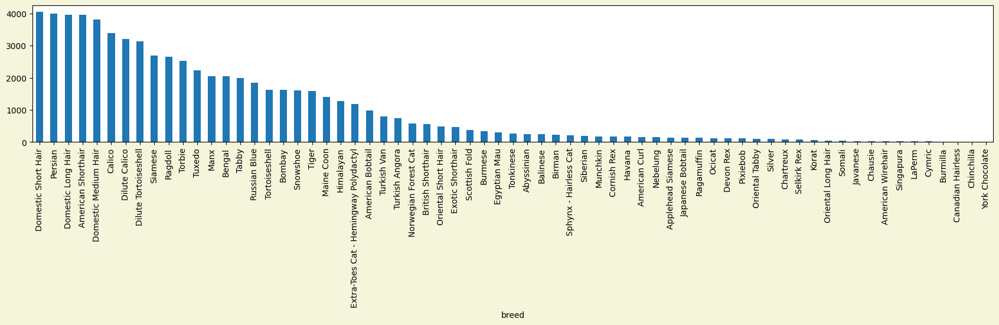

In [6]:
# Images of each breed
import matplotlib.pyplot as plt
plt.figure(facecolor="beige")
labels["breed"].value_counts().plot.bar(figsize=(21, 3))
labels["breed"].value_counts().median()

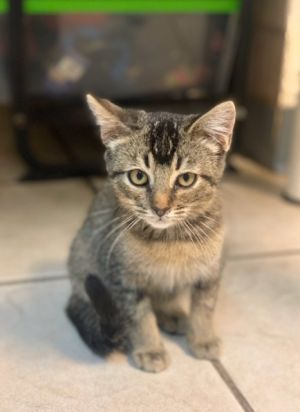

In [7]:
# Viewing images
from IPython.display import Image
Image("/content/drive/MyDrive/Projects/Code/Cats/dataset/images/Abyssinian/46620170_3.jpg")

## Getting images and their labels

In [8]:
import os
import pandas as pd
import numpy as np

# Path to your dataset folder
dataset_path = "drive/MyDrive/Projects/Code/Cats/dataset/images/"

# Convert labels["id"] to a set for faster lookup
label_ids = set(labels["id"].astype(str))  # Ensure IDs are strings for comparison

# Lists to store filtered data
filenames = []
filepaths = []
breednames = []

# Walk through all folders and files
for root, dirs, files in os.walk(dataset_path):
    # print(f"Inspecting directory: {root}, files: {files}")
  for file in files:
        # Extract the file ID (part before the underscore)
    if file.split("_")[0] in label_ids:  # Check if the file ID exists in labels["id"]
      filenames.append(file.split("_")[0])  # Append the ID
      filepaths.append(os.path.join(root, file))  # Append full path
      breednames.append(os.path.basename(root))  # Append breed (folder name)

filenames = np.array(filenames)
filepaths = np.array(filepaths)
breednames = np.array(breednames)
# Create a DataFrame with the filtered data
# filtered_data = pd.DataFrame({
#     "id": filenames,
#     "file_path": filepaths,
#     "breed": breednames
# })
# Display the filtered data
# print(filtered_data.head())
# print(f"Total filtered files: {len(filtered_data)}")


In [9]:
print(filenames[:3])
print(filepaths[:3])
print(breednames[:3])

print(len(filenames))
print(len(filepaths))
print(len(breednames))

['22161985' '21531244' '22479124']
['drive/MyDrive/Projects/Code/Cats/dataset/images/Egyptian Mau/22161985_869.jpg'
 'drive/MyDrive/Projects/Code/Cats/dataset/images/Egyptian Mau/21531244_899.jpg'
 'drive/MyDrive/Projects/Code/Cats/dataset/images/Egyptian Mau/22479124_856.jpg']
['Egyptian Mau' 'Egyptian Mau' 'Egyptian Mau']
51800
51800
51800


(-0.5, 299.5, 187.5, -0.5)

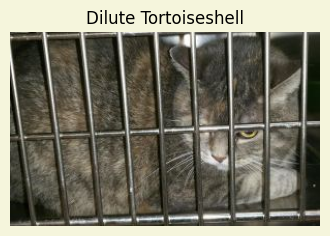

In [10]:
# Another check
import random
import matplotlib.pyplot as plt
index = random.randrange(len(filepaths))

plt.figure(figsize=(4, 4), facecolor="beige")

# Use this if you need a cmap
# image = plt.imread(file_list[index])
# # Extract the red channel
# red_channel = image[:, :, 0]
# image = plt.imread(file_list[index])
# plt.imshow(red_channel, cmap="nipy_spectral")

plt.imshow(plt.imread(filepaths[index]))
plt.title(breednames[index])
plt.axis(False)

## Converting labels to numpy arrays


In [11]:
import numpy as np
breeds = np.unique(breednames)
print(len(breeds))
breeds

58


array(['Abyssinian', 'American Bobtail', 'American Curl',
       'American Shorthair', 'American Wirehair', 'Applehead Siamese',
       'Balinese', 'Bengal', 'Birman', 'Bombay', 'British Shorthair',
       'Burmese', 'Burmilla', 'Calico', 'Canadian Hairless', 'Chartreux',
       'Chausie', 'Chinchilla', 'Cornish Rex', 'Cymric', 'Devon Rex',
       'Dilute Calico', 'Dilute Tortoiseshell', 'Domestic Long Hair',
       'Domestic Medium Hair', 'Egyptian Mau', 'Exotic Shorthair',
       'Extra-Toes Cat - Hemingway Polydactyl', 'Havana', 'Himalayan',
       'Japanese Bobtail', 'Javanese', 'Korat', 'LaPerm', 'Maine Coon',
       'Manx', 'Munchkin', 'Nebelung', 'Norwegian Forest Cat', 'Ocicat',
       'Oriental Long Hair', 'Oriental Short Hair', 'Oriental Tabby',
       'Persian', 'Pixiebob', 'Ragamuffin', 'Ragdoll', 'Russian Blue',
       'Scottish Fold', 'Selkirk Rex', 'Siamese', 'Siberian', 'Silver',
       'Singapura', 'Snowshoe', 'Somali', 'Sphynx - Hairless Cat',
       'Tabby'], dtype='

In [12]:
# Trun every label into boolean array
booleans = [breed == breeds for breed in breednames]
# for i in range(2):
print(labels["breed"][index]) # Actual Label
print(booleans[index].astype(int)) # There will be a 1 where the sample label occurs
# print(np.where(breeds == labels["breed"][i])) # Index where label occurs
# print(booleans[i].argmax()) # Index label occurs in boolean array

Persian
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [13]:
len(booleans)

51800

## Creatiing Train, Test and Validation Split

In [14]:

X = filepaths
Y = booleans

NUM_IMAGES = 1000 # @param {type: "slider", min:1000, max:10000}

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
X_train, X_val, Y_train, Y_val = train_test_split(X_train[:NUM_IMAGES], Y_train[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(Y_train), len(X_val), len(Y_val), len(X_test), len(Y_test)

(800, 800, 200, 200, 10360, 10360)

In [16]:
X_train[:3], Y_train[:3]

(array(['drive/MyDrive/Projects/Code/Cats/dataset/images/Persian/44873447_665.jpg',
        'drive/MyDrive/Projects/Code/Cats/dataset/images/Russian Blue/42183392_6381.jpg',
        'drive/MyDrive/Projects/Code/Cats/dataset/images/Maine Coon/46755576_21.jpg'],
       dtype='<U104'),
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False,  True, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False]),
  array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False,

## Preprocessing Images (turning images into tensors)

To preprocess our images into Tensors, we're going to write a function to do a few things:
1. Take an image filepath as input.
2. Use TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Convert the color channel values from 0-255 to 0-1 (Normalization)
5. Resize the `image` to be a shape of (224, 224).
6. Return the modified `image`.

In [17]:
# Cheking the shape of an image
image = plt.imread(filepaths[index])
print(image.shape)
print(image.max(), image.min())

(188, 300, 3)
255 0


In [18]:
tf.constant(image)

<tf.Tensor: shape=(188, 300, 3), dtype=uint8, numpy=
array([[[ 79,  79,  69],
        [ 81,  81,  71],
        [ 93,  93,  83],
        ...,
        [ 98,  99,  91],
        [ 98,  99,  91],
        [ 98,  99,  91]],

       [[ 61,  61,  51],
        [ 70,  70,  60],
        [ 77,  77,  67],
        ...,
        [ 89,  90,  82],
        [ 88,  89,  81],
        [ 88,  89,  81]],

       [[ 62,  60,  48],
        [ 69,  67,  55],
        [ 67,  65,  53],
        ...,
        [ 75,  76,  68],
        [ 74,  75,  67],
        [ 73,  74,  66]],

       ...,

       [[ 73,  73,  63],
        [ 78,  78,  68],
        [ 81,  81,  71],
        ...,
        [ 24,  27,  18],
        [ 24,  27,  18],
        [ 23,  26,  17]],

       [[108, 105,  96],
        [110, 107,  98],
        [110, 107,  98],
        ...,
        [ 19,  24,  17],
        [ 19,  24,  17],
        [ 20,  25,  18]],

       [[ 89,  86,  77],
        [ 88,  85,  76],
        [ 85,  82,  73],
        ...,
        [ 16,  23,  1

In [19]:
# Function to convert image to tesnor

# Define Image Size
IMG_SIZE = 224

def process_image(img_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read image
  image = tf.io.read_file(img_path)
  # Convert image to numerical tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image
  image = tf.image.resize(image, size=[img_size, img_size])
  return image

## Turning data into batches
 Why batches?
 <br>All images might not fit into memory at once.
 <br>Recommended batch size for most models is 32.
 <br><br> In order to use TensorFlow effectively, we need our data in the form of tensor tuples - `(image, label)`.

In [20]:
# Function to return a tensor tuple
def get_path_label(img_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(img_path)
  return image, label

In [21]:
# Define batch size

BATCH_SIZE = 32 # @param {type:"slider", min:0, max:32, step:4}

In [22]:
def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches out of image (X) and label (Y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If data is a test dataset, we probably don't have labels.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(get_path_label).batch(BATCH_SIZE)
    return data_batch

  # If data is validation set, we don't need to shuffle it.
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
    data_batch = data.map(get_path_label).batch(BATCH_SIZE)
    return data_batch

  # If data is training set.
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_path_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [23]:
val_data = create_data_batches(X_val, Y_val, valid_data=True)
train_data = create_data_batches(X_train, Y_train)



Creating validation data batches...
Creating training data batches...


In [24]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 58), dtype=tf.bool, name=None))>

In [25]:
# Check different attributes of our data
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 58), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 58), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Batches are hard to comprehend, so let's visualise

In [26]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(21, 8))
  # Loop through 25 (for displaying 25 images)
  for i in range(9):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(2, 9, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(breeds[labels[i].argmax()], fontsize="small")
    # Turn the grid lines off
    plt.axis("off")

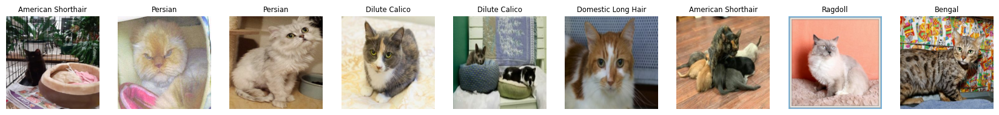

In [27]:


# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

# # Now let's visualize our validation set
# val_images, val_labels = next(val_data.as_numpy_iterator())
# show_25_images(val_images, val_labels)



## Building the Model
Before we build a model, there are a few things we need to define:
- The input shape (our images shape, in the form of Tensors) to our model.
- The output shape (image labels, in the form of Tensors) of our model.
- The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [28]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"



Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

- Takes the input shape, output shape and the model we've chosen as parameters.
- Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
- Compiles the model (says it should be evaluated and improved).
- Builds the model (tells the model the input shape it'll be getting).
- Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview


In [29]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [30]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 58)                58116     
                                                                 
Total params: 5490829 (20.95 MB)
Trainable params: 58116 (227.02 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [31]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Callbacks
- Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

- We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
  1. Load the TensorBoard notebook extension ✅
  2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
  3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard


In [32]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [33]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Projects/Code/Cats/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [34]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training the model on some of the data
Our first model is only going to train on 1000 images, to make sure everything is working.

In [35]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [36]:
  # Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(




Let's create a function which trains a model.

  - Create a model using create_model()
  - Setup a TensorBoard callback using create_tensorboard_callback()
  - Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
  - Return the model



In [37]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [38]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 128s 5s/step - loss: 3.9105 - accuracy: 0.0975 - val_loss: 3.4146 - val_accuracy: 0.1800
Epoch 2/100
25/25 [==============================] - 66s 3s/step - loss: 2.4654 - accuracy: 0.3013 - val_loss: 3.1146 - val_accuracy: 0.3000
Epoch 3/100
25/25 [==============================] - 61s 2s/step - loss: 1.8311 - accuracy: 0.4600 - val_loss: 3.0254 - val_accuracy: 0.2900
Epoch 4/100
25/25 [==============================] - 70s 3s/step - loss: 1.4511 - accuracy: 0.5913 - val_loss: 3.0461 - val_accuracy: 0.2950
Epoch 5/100
25/25 [==============================] - 63s 3s/step - loss: 1.2051 - accuracy: 0.6612 - val_loss: 3.0585 - val_accuracy: 0.2800


### Checking TensorBoard Logs

In [39]:
%tensorboard --logdir /content/drive/MyDrive/Projects/Code/Cats/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and Evaluating Predictions using a trained model

In [40]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 58), dtype=tf.bool, name=None))>

In [41]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 25s 1s/step


array([[2.45062506e-06, 9.53796133e-02, 3.81727063e-04, ...,
        2.75547472e-06, 1.71156425e-04, 2.54948670e-03],
       [5.07878685e-05, 6.50387304e-03, 4.52575181e-03, ...,
        9.81211997e-06, 2.24815638e-04, 2.24550045e-03],
       [2.65794777e-04, 3.51154758e-03, 4.22763900e-04, ...,
        7.91462808e-05, 3.24167195e-04, 5.18030080e-04],
       ...,
       [4.00948993e-05, 6.53662602e-04, 2.06629164e-03, ...,
        1.11870622e-05, 3.45448992e-04, 5.00413496e-03],
       [8.06905970e-04, 2.17903894e-03, 2.59968154e-02, ...,
        8.24460367e-05, 1.34706002e-04, 1.10033678e-03],
       [8.75549517e-07, 1.65598989e-02, 1.13156704e-04, ...,
        7.59297507e-07, 1.03392573e-04, 7.63989519e-04]], dtype=float32)

In [42]:
print(predictions.shape)
print(len(Y_val))
print(len(breeds))

(200, 58)
200
58


In [43]:
print(f"{len(predictions), len(predictions[0])}")
np.sum(predictions[0]) # Will be equal to or very close to '1' [Total Probability]


(200, 58)


1.0000002

In [44]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {breeds[np.argmax(predictions[index])]}")

[1.0507079e-05 4.5433203e-03 2.5140955e-03 1.9614100e-01 1.8199024e-06
 7.8759031e-06 5.0000905e-05 6.2441155e-03 1.8963013e-06 2.1240254e-01
 1.0046705e-03 7.0479634e-04 9.3145150e-07 1.1682814e-02 1.2856881e-05
 1.1145612e-06 1.2646760e-06 2.4002939e-05 4.8296715e-05 6.0500290e-05
 5.4962555e-07 3.3011110e-03 1.6137097e-02 1.3896451e-02 2.8886193e-01
 7.4938296e-05 5.0016642e-03 1.3613091e-01 6.0473988e-03 4.6483896e-05
 1.0443766e-06 1.0234297e-04 4.3324102e-04 2.7178865e-04 5.5180900e-03
 1.6142057e-02 6.0249941e-04 2.2692175e-05 2.2959609e-04 2.8179071e-03
 1.7432028e-05 2.5723433e-02 7.3523768e-07 3.6926238e-05 1.4112309e-04
 2.3750881e-04 6.1337714e-04 3.7049253e-02 1.7481140e-03 7.9529849e-04
 7.5123986e-05 1.1571602e-04 3.4170313e-04 4.9791717e-05 1.2738301e-04
 1.8865519e-06 6.6396402e-05 1.7605876e-03]
Max value (probability of prediction): 0.2888619303703308
Sum: 1.0000001192092896
Max index: 24
Predicted label: Domestic Medium Hair


In [45]:
breeds[35]

'Manx'



Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.


In [46]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[42])
pred_label

'Domestic Medium Hair'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [47]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[2], val_labels[2]

(array([[[0.98823535, 0.9960785 , 0.9921569 ],
         [0.98823535, 0.9960785 , 0.9921569 ],
         [0.98823535, 0.9960785 , 0.9921569 ],
         ...,
         [0.88640213, 0.6988671 , 0.5694553 ],
         [0.8860144 , 0.69847935, 0.5690676 ],
         [0.8810363 , 0.6935012 , 0.5640894 ]],
 
        [[0.9803922 , 0.9960785 , 0.9921569 ],
         [0.9843838 , 0.9960785 , 0.9921569 ],
         [0.98823535, 0.9960785 , 0.9921569 ],
         ...,
         [0.83957344, 0.6698255 , 0.55820084],
         [0.8462324 , 0.67648447, 0.5648598 ],
         [0.8529287 , 0.68318075, 0.57155615]],
 
        [[0.9803922 , 0.9960785 , 0.9921569 ],
         [0.9805348 , 0.9960785 , 0.9921569 ],
         [0.9806723 , 0.9960785 , 0.9921569 ],
         ...,
         [0.325154  , 0.18719879, 0.10036406],
         [0.36565185, 0.22769666, 0.1408619 ],
         [0.4062911 , 0.26833594, 0.18150118]],
 
        ...,
 
        [[0.8301382 , 0.77523625, 0.6615107 ],
         [0.856647  , 0.80174506, 0.68801

In [48]:
get_pred_label(predictions[2])

'Maine Coon'



Now we've got ways to get get:

  - Prediction labels
  - Validation labels (truth labels)
  - Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

  - Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
  - Convert the prediction probabilities to a predicted label. ✅
  - Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅



In [49]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

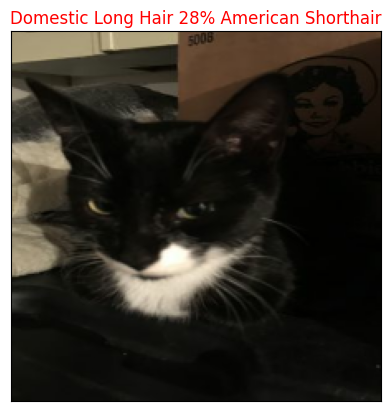

In [50]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=35)



Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

  - Take an input of prediction probabilities array and a ground truth array and an integer ✅
  - Find the prediction using get_pred_label() ✅
  - Find the top 10:
      - Prediction probabilities indexes ✅
      - Prediction probabilities values ✅
      - Prediction labels ✅
  - Plot the top 10 prediction probability values and labels, coloring the true label green ✅



In [51]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



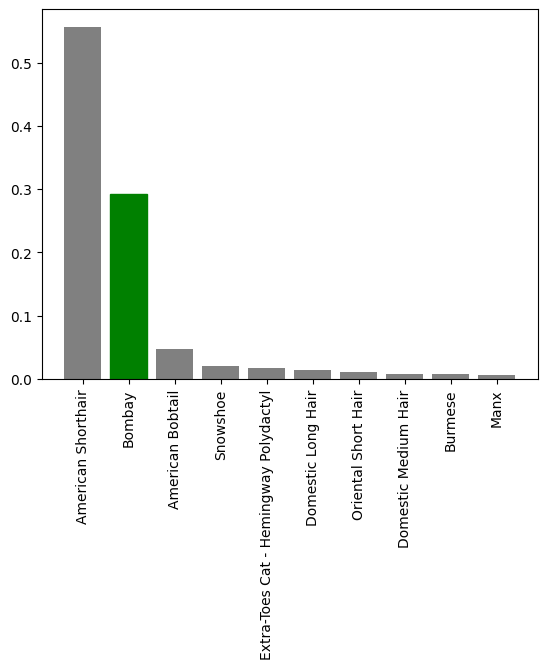

In [52]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)


Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

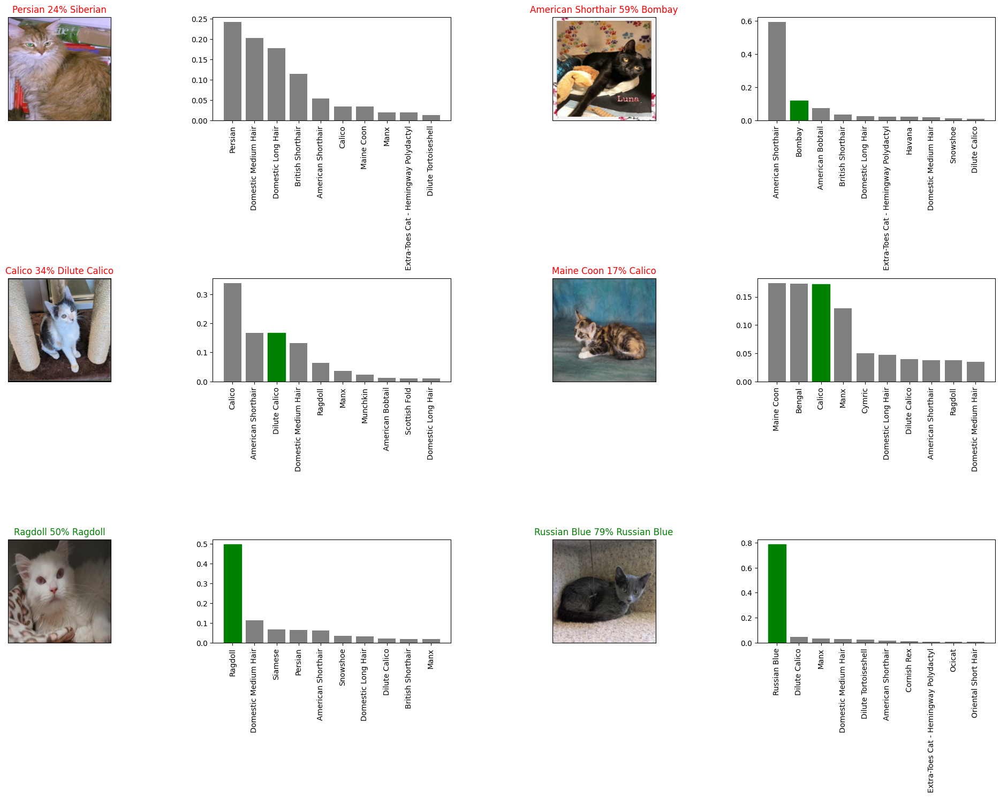

In [53]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [54]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Projects/Code/Cats/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [55]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


Now we've got functions to save and load a trained model, let's make sure they work!

In [56]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Projects/Code/Cats/models/20250108-10501736333409-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Projects/Code/Cats/models/20250108-10501736333409-1000-images-mobilenetv2-Adam.h5'

In [57]:

# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Projects/Code/Cats/models/20250108-09241736328264-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Projects/Code/Cats/models/20250108-09241736328264-1000-images-mobilenetv2-Adam.h5


In [58]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 12s 2s/step - loss: 3.0585 - accuracy: 0.2800


[3.0584731101989746, 0.2800000011920929]

In [59]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

ValueError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2066, in test_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2049, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2037, in run_step  **
        outputs = model.test_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1919, in test_step
        self.compute_loss(x, y, y_pred, sample_weight)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 1209, in compute_loss
        return self.compiled_loss(
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/losses.py", line 2221, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "/usr/local/lib/python3.10/dist-packages/keras/src/backend.py", line 5573, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, 58) and (None, 59) are incompatible


## Training model on the full data

In [ ]:
len(X), len(Y)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, Y)

In [ ]:
full_data

In [ ]:
# Create a model for full model
full_model = create_model()

In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [ ]:

# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Projects/Code/Cats/models/20250108-09241736328264-full-images-mobilenetv2-Adam.h5')

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

- Get the test image filenames. ✅
- Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
 - Make a predictions array by passing the test batches to the predict() method called on our model.



In [ ]:

# Load test image filenames
test_data = create_data_batches(X_test, Y_test, test_data=True)


In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
#np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predctions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

In [ ]:
test_predictions.shape


Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

  - Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
  - Add data to the ID column by extracting the test image ID's from their filepaths.
  - Add data (the prediction probabilites) to each of the dog breed columns.
  - Export the DataFrame as a CSV to submit it to Kaggle.



In [ ]:
# ["id"] + list(breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(breeds))
preds_df.head()

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(breeds)] = test_predictions
preds_df.head()

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Projects/Code/Cats/dataset",
                index=False)


## Making predictions on custom images

To make predictions on custom images, we'll:

  - Get the filepaths of our own images.
  - Turn the filepaths into data batches using create_data_batches().- And since our custom images won't have labels, we set the test_data parameter to True.
  - Pass the custom image data batch to our model's predict() method.
  - Convert the prediction output probabilities to predictions labels.
  - Compare the predicted labels to the custom images.



In [ ]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Projects/Code/Cats/dataset/images"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
custom_preds.shape

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)